# PHD Qualifiers: House Price Prediction | Dated: Jun 12th, 2022

In [745]:
import re
import time
import string
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import xgboost as xgb

from sklearn.model_selection import learning_curve
from sklearn.inspection import permutation_importance
from sklearn.linear_model import Ridge
from sklearn.metrics import r2_score
from sklearn import preprocessing
from sklearn.linear_model import ElasticNet
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor
from statsmodels.stats.outliers_influence import variance_inflation_factor

import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)

pd.options.mode.chained_assignment = None  # default='warn'

## Load the house prediction dataset

In [746]:
# Load the housing sales data
train = pd.read_csv('data/train.csv')
test_X = pd.read_csv('data/test.csv')

# Drop the index column
train.drop(train.columns[[0]], axis=1, inplace=True)
test_X.drop(test_X.columns[[0]], axis=1, inplace=True)

# construct train and target
train_X = train.loc[:,train.columns != 'SalePrice']
train_y = train['SalePrice']

# Check number of observations and features in test and train
print("The train data size : {} ".format(train_X.shape))
print("The test data size : {} ".format(test_X.shape))

The train data size : (1460, 79) 
The test data size : (1459, 79) 


## Perform Data Preprocessing

### 1. Handle Missing Data in Training Data Set

In [747]:
# Collect all the nullable columns
nullable_col = ["Alley", "MasVnrType", "BsmtQual", "BsmtCond", "BsmtExposure",
               "BsmtFinType1", "BsmtFinType2", "FireplaceQu", "GarageType",
               "GarageFinish", "GarageQual", "GarageCond", "PoolQC", "Fence",
               "MiscFeature"]

# Replace the NaN here with a text
train_X.loc[:,nullable_col] = train_X.loc[:,nullable_col].fillna("None")

# Check if the values look OK
for col in train_X[nullable_col]:
    print("{} --> {}".format(col, train_X[col].unique()))
    

Alley --> ['None' 'Grvl' 'Pave']
MasVnrType --> ['BrkFace' 'None' 'Stone' 'BrkCmn']
BsmtQual --> ['Gd' 'TA' 'Ex' 'None' 'Fa']
BsmtCond --> ['TA' 'Gd' 'None' 'Fa' 'Po']
BsmtExposure --> ['No' 'Gd' 'Mn' 'Av' 'None']
BsmtFinType1 --> ['GLQ' 'ALQ' 'Unf' 'Rec' 'BLQ' 'None' 'LwQ']
BsmtFinType2 --> ['Unf' 'BLQ' 'None' 'ALQ' 'Rec' 'LwQ' 'GLQ']
FireplaceQu --> ['None' 'TA' 'Gd' 'Fa' 'Ex' 'Po']
GarageType --> ['Attchd' 'Detchd' 'BuiltIn' 'CarPort' 'None' 'Basment' '2Types']
GarageFinish --> ['RFn' 'Unf' 'Fin' 'None']
GarageQual --> ['TA' 'Fa' 'Gd' 'None' 'Ex' 'Po']
GarageCond --> ['TA' 'Fa' 'None' 'Gd' 'Po' 'Ex']
PoolQC --> ['None' 'Ex' 'Fa' 'Gd']
Fence --> ['None' 'MnPrv' 'GdWo' 'GdPrv' 'MnWw']
MiscFeature --> ['None' 'Shed' 'Gar2' 'Othr' 'TenC']


In [748]:
# Replace all the empty data with NaN
train_X.loc[:,:].replace("", float("NaN"), inplace=True)
train_X.loc[:,:].replace(" ", float("NaN"), inplace=True)

# Count missing values and plot it
missing = train_X.isna().sum() / train_X.shape[0] * 100
missing_df = pd.DataFrame(missing.sort_values(ascending=False), columns=['Missing%'])
missing_df = missing_df[missing_df['Missing%'] > 0]
missing_df

,Missing%
LotFrontage,17.739726
GarageYrBlt,5.547945
MasVnrArea,0.547945
Electrical,0.068493


In [749]:
# Impute LotFrontage using the neighbourhood information
train_X["LotFrontage"] = train_X.groupby("Neighborhood")["LotFrontage"].transform(lambda x: x.fillna(x.median()))
train_X["LotFrontage"].isna().sum()

# Impute GarageYrBlt
set(train_X[train_X["GarageYrBlt"].isna()]["GarageArea"])
train_X["GarageYrBlt"] = train_X["GarageYrBlt"].fillna(0)

# Impute MasVnrArea
set(train_X[train_X["MasVnrArea"].isna()]["MasVnrType"])
train_X["MasVnrArea"] = train_X["MasVnrArea"].fillna(0)

# Impute Electrical with the mode
train_X['Electrical'] = train_X['Electrical'].fillna(train_X['Electrical'].mode()[0])

# Confirm missing values
missing = train_X.isna().sum() / train_X.shape[0] * 100
missing_df = pd.DataFrame(missing.sort_values(ascending=False), columns=['Missing%'])
missing_df = missing_df[missing_df['Missing%'] > 0]
missing_df

,Missing%


## 2. Handle Missing Data in Test Data Set

In [750]:
# Replace NaN with None in the Nullable columns
test_X.loc[:,nullable_col] = test_X.loc[:,nullable_col].fillna("None")

# Check if the values look OK
for col in test_X[nullable_col]:
    print("{} --> {}".format(col, test_X[col].unique()))

Alley --> ['None' 'Pave' 'Grvl']
MasVnrType --> ['None' 'BrkFace' 'Stone' 'BrkCmn']
BsmtQual --> ['TA' 'Gd' 'Ex' 'Fa' 'None']
BsmtCond --> ['TA' 'Po' 'Fa' 'Gd' 'None']
BsmtExposure --> ['No' 'Gd' 'Mn' 'Av' 'None']
BsmtFinType1 --> ['Rec' 'ALQ' 'GLQ' 'Unf' 'BLQ' 'LwQ' 'None']
BsmtFinType2 --> ['LwQ' 'Unf' 'Rec' 'BLQ' 'GLQ' 'ALQ' 'None']
FireplaceQu --> ['None' 'TA' 'Gd' 'Po' 'Fa' 'Ex']
GarageType --> ['Attchd' 'Detchd' 'BuiltIn' 'None' 'Basment' '2Types' 'CarPort']
GarageFinish --> ['Unf' 'Fin' 'RFn' 'None']
GarageQual --> ['TA' 'None' 'Fa' 'Gd' 'Po']
GarageCond --> ['TA' 'None' 'Fa' 'Gd' 'Po' 'Ex']
PoolQC --> ['None' 'Ex' 'Gd']
Fence --> ['MnPrv' 'None' 'GdPrv' 'GdWo' 'MnWw']
MiscFeature --> ['None' 'Gar2' 'Shed' 'Othr']


In [751]:
# Replace all the empty data with NaN
test_X.loc[:,:].replace("", float("NaN"), inplace=True)
test_X.loc[:,:].replace(" ", float("NaN"), inplace=True)

# Count missing values and plot it
missing = test_X.isna().sum() / test_X.shape[0] * 100
missing_df = pd.DataFrame(missing.sort_values(ascending=False), columns=['Missing%'])
missing_df = missing_df[missing_df['Missing%'] > 0]
missing_df

,Missing%
LotFrontage,15.558602
GarageYrBlt,5.346127
MasVnrArea,1.028101
MSZoning,0.274160
BsmtFullBath,0.137080
BsmtHalfBath,0.137080
Utilities,0.137080
Functional,0.137080
GarageArea,0.068540
TotalBsmtSF,0.068540


In [752]:
# Get median LotFrontage for each neighbourhood in train
n_df=train_X.groupby("Neighborhood")["LotFrontage"].median()
n_df=n_df.to_frame()
n_df.reset_index(inplace=True)
nbr_median={}
for i in range(n_df.shape[0]):
    nbr_median[n_df.iloc[i]["Neighborhood"]] = n_df.iloc[i]["LotFrontage"]

In [753]:
# Impute LotFrontage using the neighbourhood information
for i in list(test_X[test_X["LotFrontage"].isna()].index):
    nbr=test_X.loc[i]["Neighborhood"]
    test_X.at[i, 'LotFrontage'] = nbr_median[nbr]    
print("check missing frontage nums: ", test_X["LotFrontage"].isna().sum())

# Impute Garage related variables
set(test_X[test_X["GarageYrBlt"].isna()]["GarageArea"])
# Handle this special case where there is Gararge Area but no Year built
test_X[(test_X["GarageArea"]==360) & (test_X["GarageYrBlt"].isna())]["GarageYrBlt"] = train_X["GarageYrBlt"].median()
test_X["GarageYrBlt"] = test_X["GarageYrBlt"].fillna(0)
test_X["GarageArea"] = test_X["GarageArea"].fillna(0)
test_X["GarageCars"] = test_X["GarageCars"].fillna(0)

# Impute MasVnrArea
set(test_X[test_X["MasVnrArea"].isna()]["MasVnrType"])
test_X["MasVnrArea"] = test_X["MasVnrArea"].fillna(0)

# Impute MS Zoning
test_X['MSZoning'] = test_X['MSZoning'].fillna(train_X['MSZoning'].mode()[0])

# Impute Basement related features. Putting to zero as there is no basement
bsmt_c = ["BsmtFullBath", "BsmtHalfBath"]
for f in bsmt_c:
    test_X[f] = test_X[f].fillna(0)

bsmt_n = ["TotalBsmtSF", "BsmtUnfSF" ,"BsmtFinSF2", "BsmtFinSF1"]
for f in bsmt_n:
    test_X[f] = test_X[f].fillna(0)
    
# Impute Utilities most likely we'll drop it as there is only one value
test_X["Utilities"] = test_X["Utilities"].fillna('None')

# Impute Functional to typical
test_X["Functional"] = test_X["Functional"].fillna("Typ")

# Impute Kitchen Quality
test_X['KitchenQual'] = test_X['KitchenQual'].fillna(train_X['KitchenQual'].mode()[0])

# Impute Exterior
test_X['Exterior1st'] = test_X['Exterior1st'].fillna(train_X['Exterior1st'].mode()[0])
test_X['Exterior2nd'] = test_X['Exterior2nd'].fillna(train_X['Exterior2nd'].mode()[0])

# Impute Sale type
test_X['SaleType'] = test_X['SaleType'].fillna(train_X['SaleType'].mode()[0])

check missing frontage nums:  0


In [754]:
# Check if the missing values in test is addresed
# Count missing values and plot it
missing = test_X.isna().sum() / test_X.shape[0] * 100
missing_df = pd.DataFrame(missing.sort_values(ascending=False), columns=['Missing%'])
missing_df = missing_df[missing_df['Missing%'] > 0]
missing_df

,Missing%


### 3. Remove Outliers from the train data set

In [755]:
plt.figure(figsize=(16,8), dpi=1000)
train_X["price/liv_area"] = train_y / train_X["GrLivArea"]
train_X.reset_index(drop=True)
sns.boxplot(x='Neighborhood',y='price/liv_area',data=train_X, palette='rainbow', showfliers = False)
sns.swarmplot(x='Neighborhood',y='price/liv_area',dodge=True,
                  data=train_X, alpha=.8,color='gray',s=2.5)
plt.title("Price/Living Area by Sale Condition")
plt.xticks(rotation=90)
plt.ylabel("price per sq. ft. (living area)")
plt.savefig('images/outlier_price_nbr.png', format='png', dpi=600, bbox_inches = 'tight')
plt.show()

In [756]:
del_idx = []
k = 1.5
for n in set(train_X["Neighborhood"]):
    Q1 = train_X[train_X["Neighborhood"] == n]["price/liv_area"].quantile(0.25)
    Q3 = train_X[train_X["Neighborhood"] == n]["price/liv_area"].quantile(0.75)
    IQR = Q3 - Q1
    f = (train_X[train_X["Neighborhood"] == n]["price/liv_area"] < Q1 - k*IQR) \
                | (train_X[train_X["Neighborhood"] == n]["price/liv_area"] > Q3 + k*IQR)
    del_idx = del_idx + list(f[f].index)

# Remove outliers
train_X = train_X.drop(del_idx)
train_y = train_y.drop(del_idx)
train_X = train_X.reset_index(drop=True)
train_y = train_y.reset_index(drop=True)

In [757]:
# Analyze the box plot with removed outliers
plt.figure(figsize=(16,8), dpi=1000)
sns.boxplot(x='Neighborhood',y='price/liv_area',data=train_X, palette='rainbow', showfliers = False)
sns.swarmplot(x='Neighborhood',y='price/liv_area',dodge=True,
                  data=train_X, alpha=.8,color='gray',s=2.5)
plt.title("Price/Living Area by Sale Condition")
plt.xticks(rotation=90)
plt.ylabel("price per sq. ft. (living area)")
plt.show()

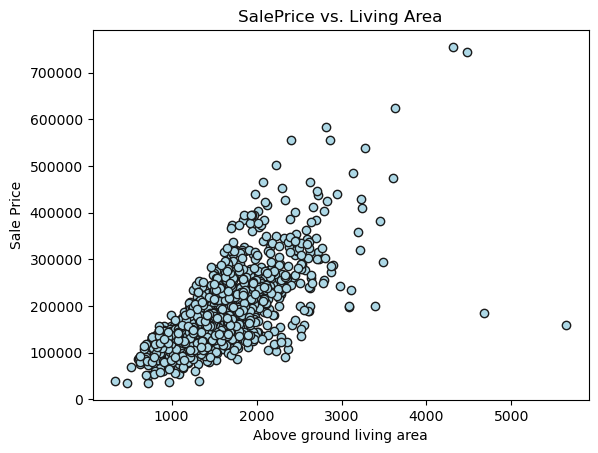

In [758]:
# Analyze scatter plot between price and living area
# Ref: https://seaborn.pydata.org/generated/seaborn.scatterplot.html
scat = pd.concat([train_X, train_y], axis = 1)
plt.scatter(scat["GrLivArea"], scat["SalePrice"], c='lightblue', edgecolor='k')
plt.title("SalePrice vs. Living Area")
plt.xlabel('Above ground living area')
plt.ylabel('Sale Price')
plt.savefig('images/outlier_price_living.png', format='png', dpi=600, bbox_inches = 'tight')
plt.show()

In [759]:
# Remove outliers from the scatter plt
del_idx_2 = train_X[train_X['GrLivArea']>4500].index
train_X = train_X.drop(del_idx_2)
train_y = train_y.drop(del_idx_2)
train_X = train_X.reset_index(drop=True)
train_y = train_y.reset_index(drop=True)

In [760]:
del_idx_2

Int64Index([519, 1282], dtype='int64')

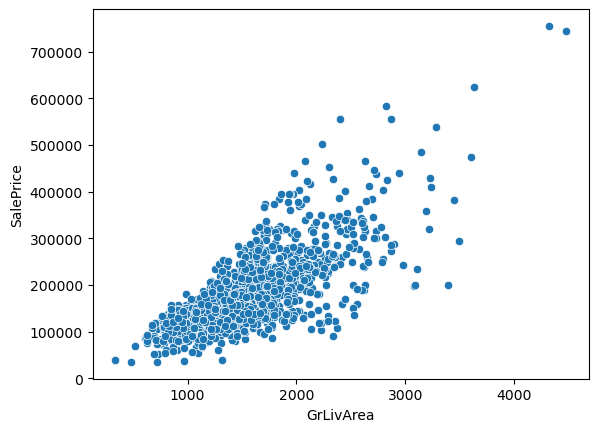

(1440, 79)

In [761]:
# Analyze scatter plot again and check outliers are removed
scat = pd.concat([train_X, train_y], axis = 1)
sns.scatterplot(data=scat, x="GrLivArea", y="SalePrice")
plt.show()

# Drop the price/liv area column as well
train_X = train_X.drop(["price/liv_area"], axis=1)
train_X.shape

In [762]:
# Summary statistics
train_X.describe()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold
count,1440.000000,1440.000000,1440.000000,1440.000000,1440.000000,1440.000000,1440.000000,1440.000000,1440.000000,1440.000000,...,1440.000000,1440.000000,1440.000000,1440.000000,1440.000000,1440.000000,1440.000000,1440.000000,1440.000000,1440.000000
mean,56.947917,69.885069,10446.415972,6.086806,5.570833,1971.159028,1984.716667,101.645833,434.355556,46.547917,...,471.164583,93.659722,46.072917,22.115972,3.350694,15.270139,2.463889,44.093056,6.319444,2007.807639
std,42.351495,21.220552,9906.481528,1.367281,1.107425,30.176762,20.603784,178.712520,428.477717,161.313185,...,212.708683,125.552752,65.139970,61.379529,29.253106,56.115078,38.447207,499.532145,2.696490,1.329025
min,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000
25%,20.000000,60.000000,7538.750000,5.000000,5.000000,1954.000000,1966.000000,0.000000,0.000000,0.000000,...,326.750000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000
50%,50.000000,70.000000,9458.500000,6.000000,5.000000,1972.500000,1993.000000,0.000000,380.500000,0.000000,...,478.000000,0.000000,24.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000
75%,70.000000,80.000000,11503.000000,7.000000,6.000000,2000.000000,2004.000000,162.250000,702.500000,0.000000,...,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000
max,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,2096.000000,1474.000000,...,1390.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000


## Exploratory Data Analysis

### Price distribution by neighbourhood

In [763]:
plt.figure(figsize=(16,8), dpi=1000)
box_price_data=pd.concat([train_X, train_y], axis=1)
sns.boxplot(x='Neighborhood',y='SalePrice',data=box_price_data, palette='rainbow', showfliers = False)
sns.swarmplot(x='Neighborhood',y='SalePrice',dodge=True,
                  data=box_price_data, alpha=.8,color='gray',s=2)
plt.title("Price by Neighbourhood")
plt.xticks(rotation=90)
plt.ylabel("price")
plt.show()

/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 7.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


## Feature Engineering

In [764]:
# Combine Test and Train
train_rows=train_X.shape[0]
full_data=pd.concat([train_X, test_X], axis=0)
full_data.reset_index(drop=True)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,60,RL,65.0,8450,Pave,None,Reg,Lvl,AllPub,Inside,...,0,0,None,None,None,0,2,2008,WD,Normal
1,20,RL,80.0,9600,Pave,None,Reg,Lvl,AllPub,FR2,...,0,0,None,None,None,0,5,2007,WD,Normal
2,60,RL,68.0,11250,Pave,None,IR1,Lvl,AllPub,Inside,...,0,0,None,None,None,0,9,2008,WD,Normal
3,70,RL,60.0,9550,Pave,None,IR1,Lvl,AllPub,Corner,...,0,0,None,None,None,0,2,2006,WD,Abnorml
4,60,RL,84.0,14260,Pave,None,IR1,Lvl,AllPub,FR2,...,0,0,None,None,None,0,12,2008,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2894,160,RM,21.0,1936,Pave,None,Reg,Lvl,AllPub,Inside,...,0,0,None,None,None,0,6,2006,WD,Normal
2895,160,RM,21.0,1894,Pave,None,Reg,Lvl,AllPub,Inside,...,0,0,None,None,None,0,4,2006,WD,Abnorml
2896,20,RL,160.0,20000,Pave,None,Reg,Lvl,AllPub,Inside,...,0,0,None,None,None,0,9,2006,WD,Abnorml
2897,85,RL,62.0,10441,Pave,None,Reg,Lvl,AllPub,Inside,...,0,0,None,MnPrv,Shed,700,7,2006,WD,Normal


### 1. Add new features

In [765]:
full_data["house_age"] = full_data["YrSold"] - full_data["YearBuilt"]
full_data["remod_age"] = full_data["YrSold"] - full_data["YearRemodAdd"]

# Fix a data issue with garage built year
full_data.loc[full_data['GarageYrBlt'] == 2207, 'GarageYrBlt'] = 2006
full_data["garage_age"] = full_data["YrSold"] - full_data["GarageYrBlt"]
full_data.loc[full_data['GarageYrBlt'] == 0, 'garage_age'] = 0

full_data.drop(["YearBuilt", "YearRemodAdd", "GarageYrBlt"], axis=1, inplace=True)

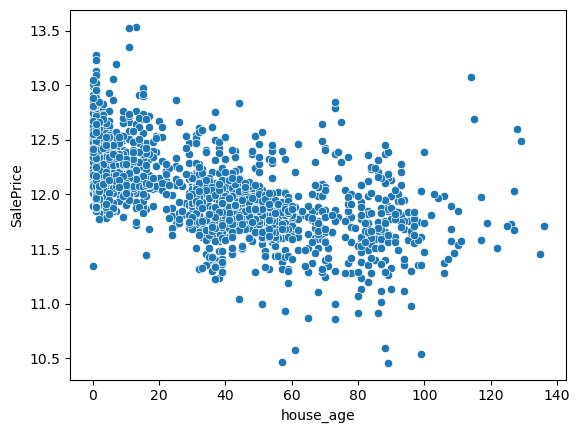

-0.5227882964405317

In [766]:
# Analyze scatter plot for age related variables
scat = pd.concat([full_data[:train_rows], np.log(train_y)], axis = 1)
sns.scatterplot(data=scat, x="house_age", y="SalePrice")
plt.show()
np.corrcoef(full_data[:train_rows]["house_age"], train_y)[0,1]

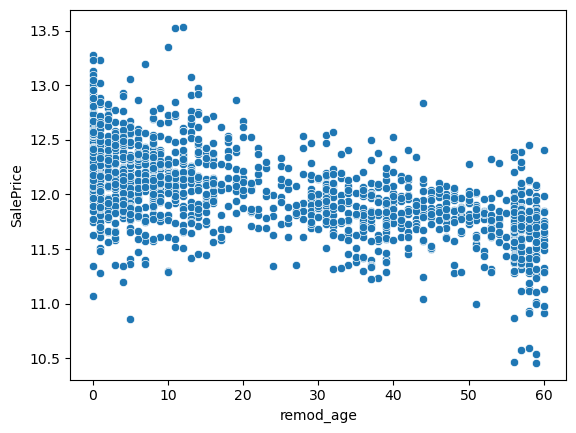

-0.5664552940019285

In [767]:
# Analyze scatter plot for age related variables
sns.scatterplot(data=scat, x="remod_age", y="SalePrice")
plt.show()
np.corrcoef(full_data[:train_rows]["remod_age"], np.log(train_y))[0,1]

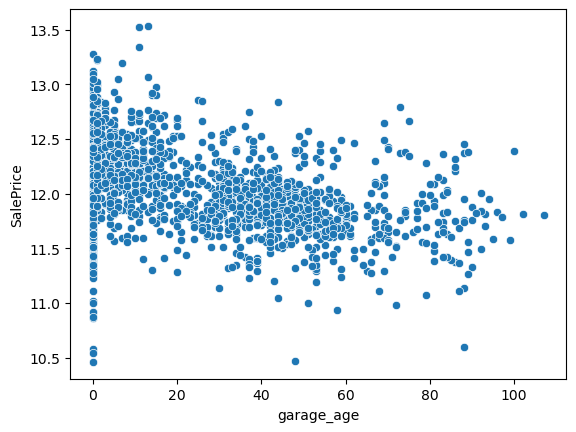

-0.391028126534651

In [768]:
# Analyze scatter plot for age related variables
sns.scatterplot(data=scat, x="garage_age", y="SalePrice")
plt.show()
np.corrcoef(full_data[:train_rows]["garage_age"], np.log(train_y))[0,1]

### Issue with garage area

### 2. Encode ordinal variables

In [769]:
# The following three variables are already in numeric order
# 1.OverallQual 2.OverallCond 3.MSSubClass
# We will handle the remaining

# rescale 1.OverallQual 2.OverallCond 3.MSSubClass
num_ord = ["OverallQual", "OverallCond", "MSSubClass"]
for f in num_ord:
    full_data[f] = full_data[f]

ord_vars = [
     "ExterQual"
    ,"ExterCond"
    ,"BsmtQual"
    ,"BsmtCond"
    ,"BsmtExposure"
    ,"BsmtFinType1"
    ,"BsmtFinType2"
    ,"HeatingQC"
    ,"KitchenQual"
    ,"Functional"
    ,"FireplaceQu"
    ,"GarageQual"
    ,"GarageCond"
    ,"PoolQC"
    ,"GarageFinish"
    ,"PavedDrive"
    ,"LotShape"
    ,"Utilities"
]

# ordinal dictionaries
ord_dict = {
         'ExterQual' : {'Po':1, 'TA':3, 'Ex':5, 'Fa':2, 'Gd':4, 'None':0}
        ,'ExterCond' : {'Po':1, 'TA':3, 'Ex':5, 'Fa':2, 'Gd':4, 'None':0}
        ,'BsmtQual' : {'Po':1, 'TA':3, 'Ex':5, 'Fa':2, 'Gd':4, 'None':0}
        ,'BsmtCond' : {'Po':1, 'TA':3, 'Ex':5, 'Fa':2, 'Gd':4, 'None':0}
        ,'BsmtExposure' : {'Mn':2, 'No':1, 'Av':3, 'None':0, 'Gd':4}
        ,'BsmtFinType1' : {'ALQ':5, 'LwQ':2, 'Rec':3, 'GLQ':6, 'Unf':1, 'None':0, 'BLQ':4}
        ,'BsmtFinType2' : {'ALQ':5, 'LwQ':2, 'Rec':3, 'GLQ':6, 'Unf':1, 'None':0, 'BLQ':4}
        ,'HeatingQC' : {'Po':1, 'TA':3, 'Ex':5, 'Fa':2, 'Gd':4, 'None':0}
        ,'KitchenQual' : {'Po':1, 'TA':3, 'Ex':5, 'Fa':2, 'Gd':4, 'None':0}
        ,'Functional' : {'Typ':8, 'Min1':7, 'Sev':2, 'Mod':5, 'Maj1':4, 'Maj2':3, 'Min2':6,'Sal':1}
        ,'FireplaceQu' : {'Po':1, 'TA':3, 'Ex':5, 'Fa':2, 'Gd':4, 'None':0}
        ,'GarageQual' : {'Po':1, 'TA':3, 'Ex':5, 'Fa':2, 'Gd':4, 'None':0}
        ,'GarageCond' : {'Po':1, 'TA':3, 'Ex':5, 'Fa':2, 'Gd':4, 'None':0}
        ,'PoolQC' : {'Po':1, 'TA':3, 'Ex':5, 'Fa':2, 'Gd':4, 'None':0}
        ,'GarageFinish' : {'RFn':2, 'None':0, 'Fin':3, 'Unf':1}
        ,'PavedDrive' : {'N':1, 'P':2, 'Y':3}
        ,'LotShape' : {'IR3':1, 'IR2':2, 'IR1':3, 'Reg':4}
        ,'Utilities' : {'None':0, 'AllPub':4, 'NoSeWa':2, 'NoSewr':3, 'ELO':1}    
}


for ov in ord_vars:
    full_data[ov] = full_data[ov].map(ord_dict[ov])

### 3. Encode nominal variables

In [770]:
# Transform nominal variables stored as numeric variables
num_cat = ["MoSold", "YrSold"]
for cat in num_cat:
    full_data[cat] = full_data[cat].astype(str)
    full_data[cat] = full_data[cat].astype(str)

nom_vars=[
        "MSZoning"
        ,"Street"
        ,"Alley"
        ,"LandContour"
        ,"LotConfig"
        ,"LandSlope"
        ,"Neighborhood"
        ,"Condition1"
        ,"Condition2"
        ,"BldgType"
        ,"HouseStyle"
        ,"RoofStyle"
        ,"RoofMatl"
        ,"Exterior1st"
        ,"Exterior2nd"
        ,"MasVnrType"
        ,"Foundation"
        ,"Heating"
        ,"CentralAir"
        ,"Electrical"
        ,"GarageType"
        ,"MiscFeature"
        ,"SaleType"
        ,"SaleCondition"
        ,"YrSold"
        ,"MoSold"
        ,"Fence"
]

dm_list=[]
for nv in nom_vars:
    dm_list.append(pd.get_dummies(full_data[nv], drop_first=True, prefix=nv))

# Add encoded variables
full_data=pd.concat([full_data] + dm_list, axis=1)

# Drop one hot encoded features
full_data.drop(nom_vars, axis=1, inplace=True)

### 4. Re-construct test and train

In [771]:
# Check 
print("Train dim orig: ", train_X.shape)
train_X = full_data[:train_rows]
print("Train dim final: ", train_X.shape)

print("Test dim orig: ", test_X.shape)
test_X = full_data[train_rows:]
print("Test dim final: ", test_X.shape)

Train dim orig:  (1440, 79)
Train dim final:  (1440, 218)
Test dim orig:  (1459, 79)
Test dim final:  (1459, 218)


### 5.  Standardize numerical variables

In [772]:
# num_vars_cont = [
#      'LotFrontage'
#     ,'LotArea'
#     ,'MasVnrArea'
#     ,'BsmtFinSF1'
#     ,'BsmtFinSF2'
#     ,'BsmtUnfSF'
#     ,'TotalBsmtSF'
#     ,'1stFlrSF'
#     ,'2ndFlrSF'
#     ,'LowQualFinSF'
#     ,'GrLivArea'
#     ,'GarageArea'
#     ,'WoodDeckSF'
#     ,'OpenPorchSF'
#     ,'EnclosedPorch'
#     ,'3SsnPorch'
#     ,'ScreenPorch'
#     ,'PoolArea'
#     ,'MiscVal'
# ]

# num_vars_dsc = [
#      'BsmtFullBath'
#     ,'BsmtHalfBath'
#     ,'FullBath'
#     ,'HalfBath'
#     ,'BedroomAbvGr'
#     ,'KitchenAbvGr'
#     ,'TotRmsAbvGrd'
#     ,'Fireplaces'
#     ,'GarageCars'
#     ,'house_age'
#     ,'remod_age'
#     ,'garage_age'    
# ]

# for feature in num_vars_cont:
#     mu = train_X[feature].mean()
#     sigma = train_X[feature].std()
#     train_X[feature+"_cont"] = train_X[feature].apply(lambda x: (x - mu) / sigma)
#     test_X[feature+"_cont"] = test_X[feature].apply(lambda x: (x - mu) / sigma)

# # Drop continuous features
# train_X.drop(num_vars_cont, axis=1, inplace=True)
# test_X.drop(num_vars_cont, axis=1, inplace=True)

# for feature in num_vars_dsc:
#     mu = train_X[feature].mean()
#     sigma = train_X[feature].std()
#     train_X[feature+"_dsc"] = train_X[feature].apply(lambda x: (x - mu) / sigma)
#     test_X[feature+"_dsc"] = test_X[feature].apply(lambda x: (x - mu) / sigma)

# # Drop discrete features
# train_X.drop(num_vars_dsc, axis=1, inplace=True)
# test_X.drop(num_vars_dsc, axis=1, inplace=True)


sts = preprocessing.StandardScaler()
train_X = pd.DataFrame(sts.fit_transform(train_X), columns=train_X.columns)
test_X = pd.DataFrame(sts.transform(test_X), columns=test_X.columns)


## Save the dataset before eliminating features
train_X.to_csv('data/train_full_X.csv', index=False) 
test_X.to_csv('data/test_full_X.csv', index=False) 

## Create a copy of this full data
train_full_X = train_X.copy()
test_full_X = test_X.copy()

### 6. Analyze the response variable

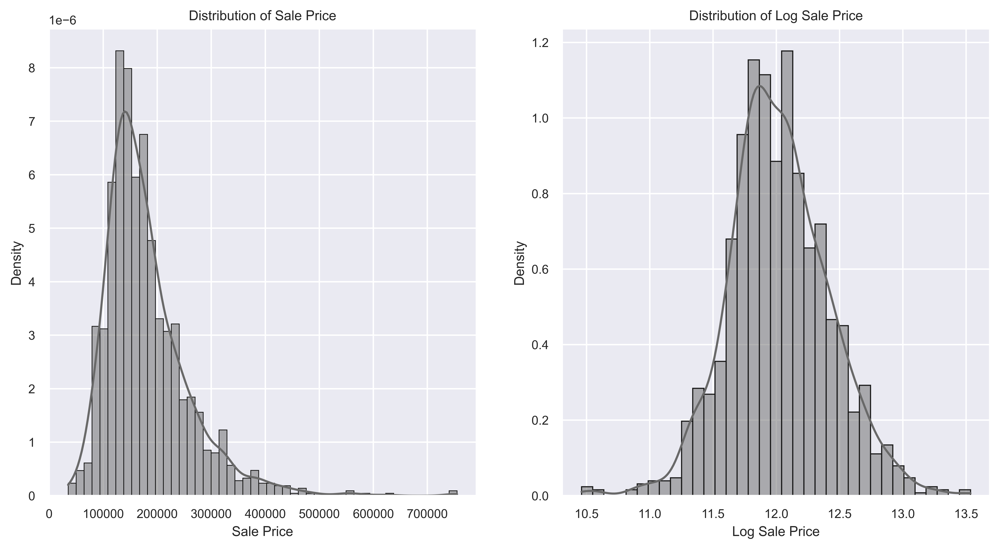

In [785]:
fig, axs = plt.subplots(1, 2, figsize=(12,6), dpi=600) 

sns.histplot(ax=axs[0], data=pd.DataFrame({"Sale_Price":train_y}), \
             x="Sale_Price", kde=True, stat='density', color='dimgray', edgecolor='k')
axs[0].set_xlabel('Sale Price')
axs[0].set_ylabel('Density')
axs[0].set_title("Distribution of Sale Price")
sns.histplot(ax=axs[1], data=pd.DataFrame({"log_Sale_Price":np.log(train_y)}), \
             x="log_Sale_Price", kde=True, stat='density', color='dimgray', edgecolor='k')
axs[1].set_xlabel('Log Sale Price')
axs[1].set_ylabel('Density')
axs[1].set_title("Distribution of Log Sale Price")


plt.savefig('images/sale_price_dist.png', format='png', dpi=600, bbox_inches = 'tight')
plt.show()

## Feature Selection

### 1. Correlation between continuous variables

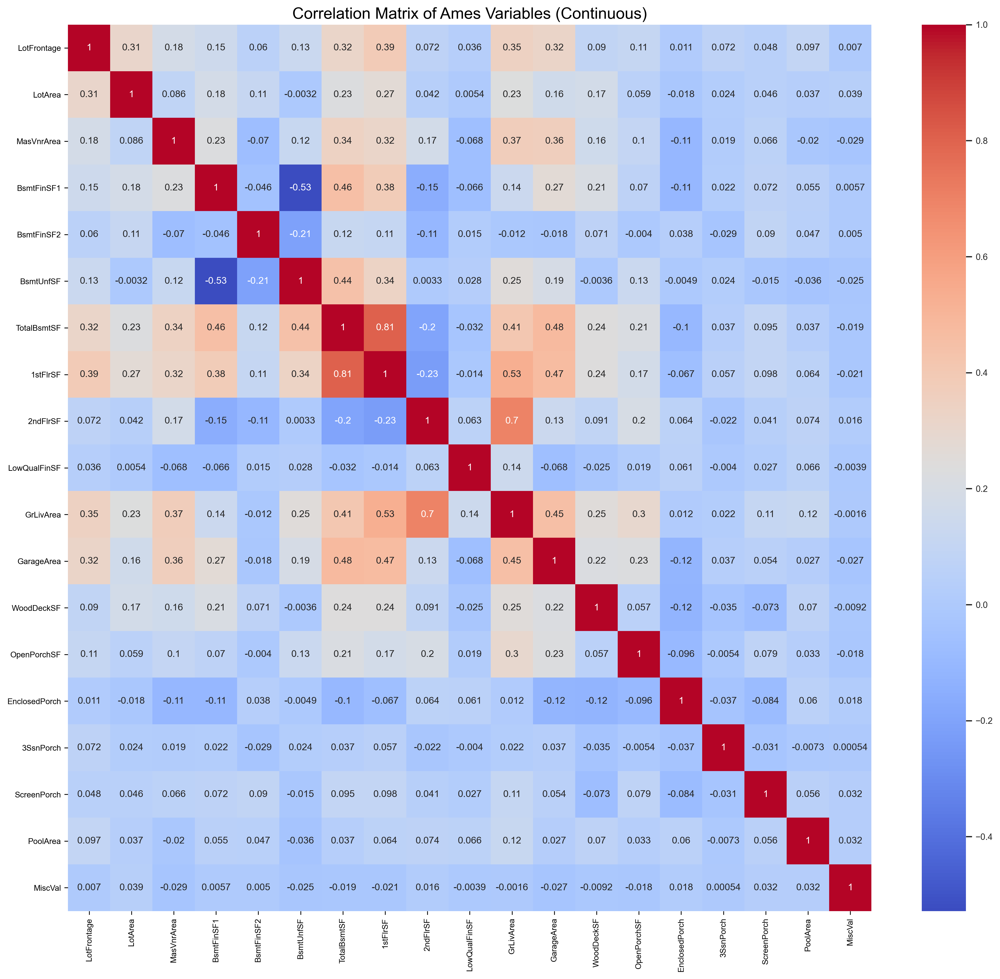

In [773]:
num_vars_cont = [
     'LotFrontage'
    ,'LotArea'
    ,'MasVnrArea'
    ,'BsmtFinSF1'
    ,'BsmtFinSF2'
    ,'BsmtUnfSF'
    ,'TotalBsmtSF'
    ,'1stFlrSF'
    ,'2ndFlrSF'
    ,'LowQualFinSF'
    ,'GrLivArea'
    ,'GarageArea'
    ,'WoodDeckSF'
    ,'OpenPorchSF'
    ,'EnclosedPorch'
    ,'3SsnPorch'
    ,'ScreenPorch'
    ,'PoolArea'
    ,'MiscVal'
]

fig, ax = plt.subplots(figsize=(18, 16), dpi=300)

sns.set(font_scale=0.8)
sns.heatmap(train_X[num_vars_cont].corr(), annot=True, cmap='coolwarm', ax=ax)
ax.set_title("Correlation Matrix of Ames Variables (Continuous)", fontsize=16)
ax.set_xticklabels(ax.get_xmajorticklabels(), fontsize=8)
ax.set_yticklabels(ax.get_ymajorticklabels(), fontsize=8)
plt.savefig('images/cont_correlation.png', format='png', dpi=600, bbox_inches = 'tight')

plt.show()

# Drop correlated features
cont_corr_features=['TotalBsmtSF', '2ndFlrSF']

train_X.drop(cont_corr_features, axis=1, inplace=True)
test_X.drop(cont_corr_features, axis=1, inplace=True)

### 2. Correlation between ordinal variables

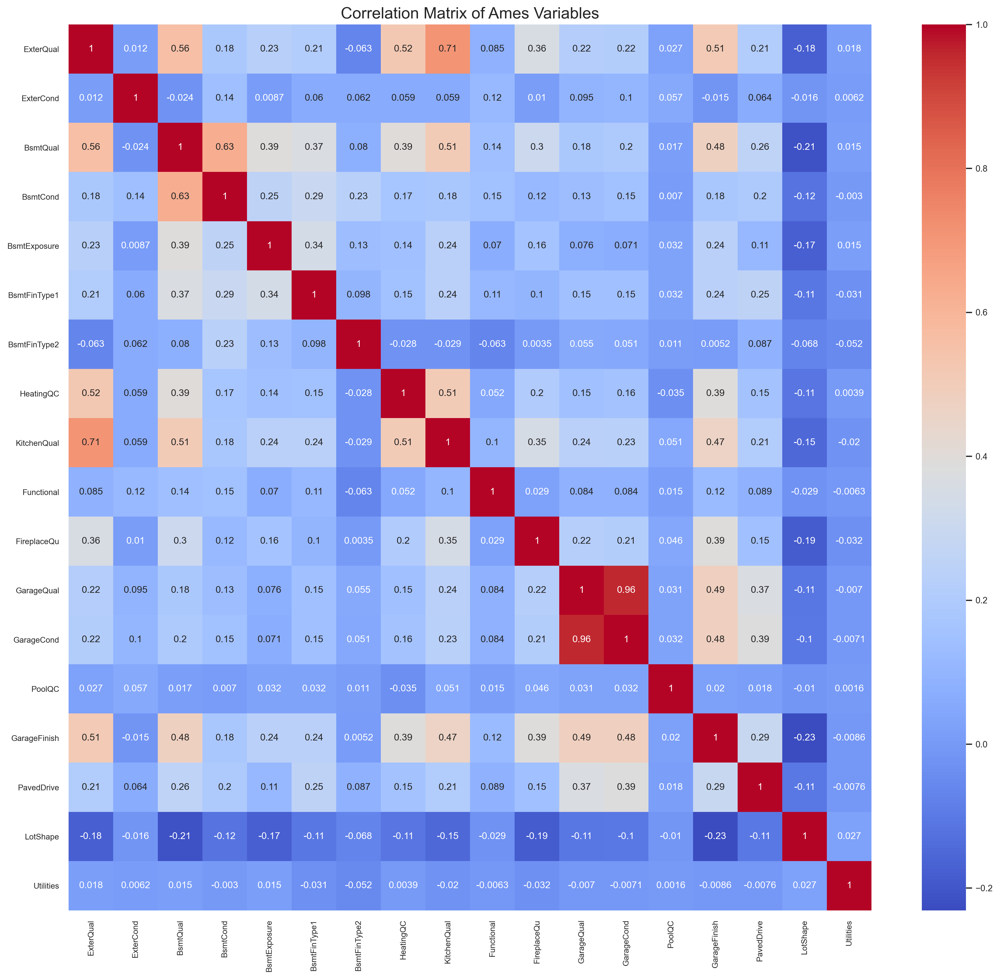

In [774]:
ord_vars = [
     "ExterQual"
    ,"ExterCond"
    ,"BsmtQual"
    ,"BsmtCond"
    ,"BsmtExposure"
    ,"BsmtFinType1"
    ,"BsmtFinType2"
    ,"HeatingQC"
    ,"KitchenQual"
    ,"Functional"
    ,"FireplaceQu"
    ,"GarageQual"
    ,"GarageCond"
    ,"PoolQC"
    ,"GarageFinish"
    ,"PavedDrive"
    ,"LotShape"
    ,"Utilities"
]

fig, ax = plt.subplots(figsize=(18, 16), dpi=300)

sns.set(font_scale=0.8)
sns.heatmap(train_X[ord_vars].corr(), annot=True, cmap='coolwarm', ax=ax)
ax.set_title("Correlation Matrix of Ames Variables", fontsize=16)
ax.set_xticklabels(ax.get_xmajorticklabels(), fontsize=8)
ax.set_yticklabels(ax.get_ymajorticklabels(), fontsize=8)
plt.show()

# Drop correlated features
ord_corr_features=['ExterQual', 'BsmtQual', 'GarageCond']

train_X.drop(ord_corr_features, axis=1, inplace=True)
test_X.drop(ord_corr_features, axis=1, inplace=True)

### 3. Correlation between discrete variables

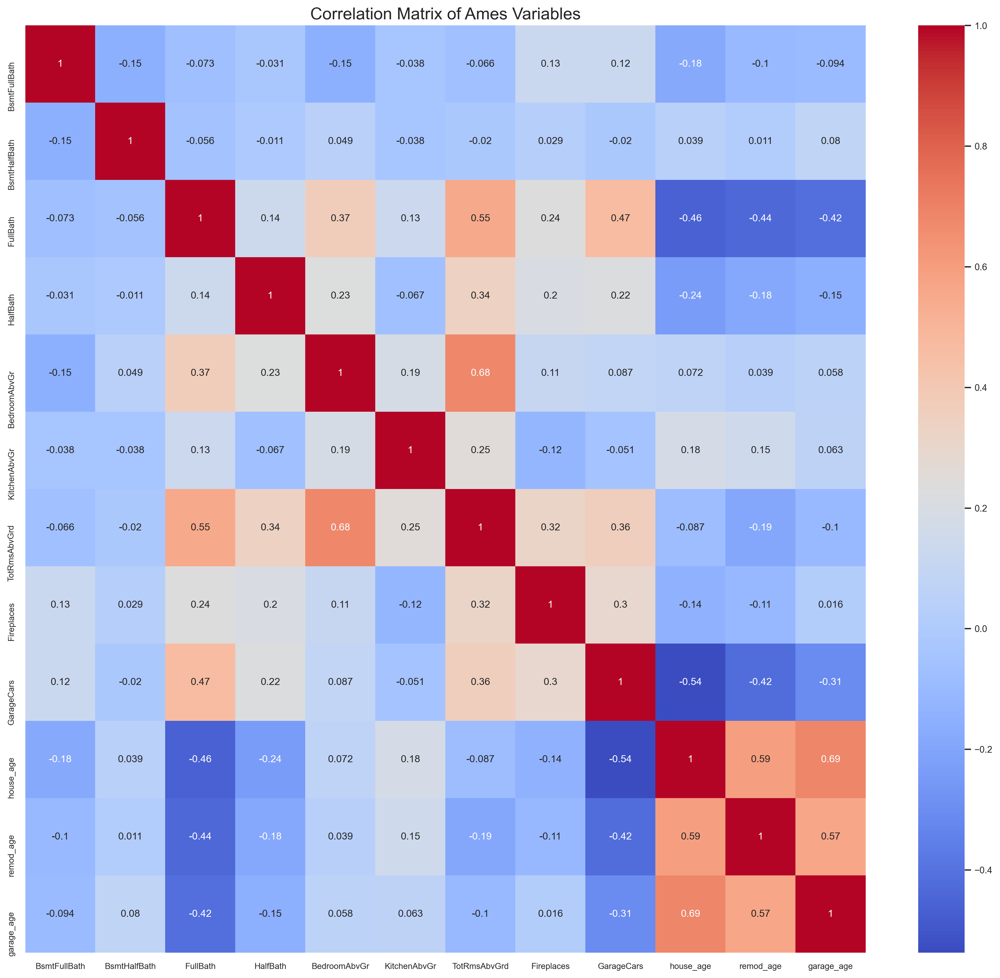

In [775]:
num_vars_dsc = [
     'BsmtFullBath'
    ,'BsmtHalfBath'
    ,'FullBath'
    ,'HalfBath'
    ,'BedroomAbvGr'
    ,'KitchenAbvGr'
    ,'TotRmsAbvGrd'
    ,'Fireplaces'
    ,'GarageCars'
    ,'house_age'
    ,'remod_age'
    ,'garage_age'    
]

fig, ax = plt.subplots(figsize=(18, 16), dpi=300)

sns.set(font_scale=0.8)
sns.heatmap(train_X[num_vars_dsc].corr(), annot=True, cmap='coolwarm', ax=ax)
ax.set_title("Correlation Matrix of Ames Variables", fontsize=16)
ax.set_xticklabels(ax.get_xmajorticklabels(), fontsize=8)
ax.set_yticklabels(ax.get_ymajorticklabels(), fontsize=8)
plt.show()

# Drop correlated features
ord_dsc_features=['TotRmsAbvGrd', 'remod_age', 'garage_age']

train_X.drop(ord_dsc_features, axis=1, inplace=True)
test_X.drop(ord_dsc_features, axis=1, inplace=True)

### 4. Select features based on VIF

In [776]:
# Calculate VIF for each variable

vif = pd.DataFrame()
vif["Features"] = train_X.columns
vif_data = []
vif_col_drop = []
for i in range(train_X.shape[1]):  
    col_vif=variance_inflation_factor(train_X.values, i)
    vif_data.append(col_vif)
    if col_vif > 10:
        vif_col_drop.append(train_X.columns[i])

train_X.drop(vif_col_drop, axis=1, inplace=True)
test_X.drop(vif_col_drop, axis=1, inplace=True)
    
vif["VIF"] = vif_data
print(vif.to_markdown())

/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/statsmodels/stats/outliers_influence.py:193: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)


|     | Features              |       VIF |
|----:|:----------------------|----------:|
|   0 | MSSubClass            |  33.0826  |
|   1 | LotFrontage           |   2.54103 |
|   2 | LotArea               |   2.81144 |
|   3 | LotShape              |   1.71033 |
|   4 | Utilities             |   1.33178 |
|   5 | OverallQual           |   5.08541 |
|   6 | OverallCond           |   2.17688 |
|   7 | MasVnrArea            |   2.91612 |
|   8 | ExterCond             |   1.51473 |
|   9 | BsmtCond              |   3.18338 |
|  10 | BsmtExposure          |   2.19059 |
|  11 | BsmtFinType1          |   3.11738 |
|  12 | BsmtFinSF1            |  10.8825  |
|  13 | BsmtFinType2          |   3.5482  |
|  14 | BsmtFinSF2            |   4.41396 |
|  15 | BsmtUnfSF             |   9.48587 |
|  16 | HeatingQC             |   2.2952  |
|  17 | 1stFlrSF              |  17.0288  |
|  18 | LowQualFinSF          |   2.05997 |
|  19 | GrLivArea             |  20.1442  |
|  20 | BsmtFullBath          | 

In [777]:
vif_col_drop

['MSSubClass',
 'BsmtFinSF1',
 '1stFlrSF',
 'GrLivArea',
 'GarageQual',
 'PoolArea',
 'PoolQC',
 'MiscVal',
 'house_age',
 'MSZoning_FV',
 'MSZoning_RL',
 'MSZoning_RM',
 'Neighborhood_CollgCr',
 'Neighborhood_Edwards',
 'Neighborhood_NAmes',
 'Neighborhood_OldTown',
 'Neighborhood_Somerst',
 'Condition2_Norm',
 'BldgType_TwnhsE',
 'HouseStyle_1Story',
 'RoofStyle_Gable',
 'RoofStyle_Hip',
 'Exterior1st_BrkFace',
 'Exterior1st_CBlock',
 'Exterior1st_CemntBd',
 'Exterior1st_HdBoard',
 'Exterior1st_MetalSd',
 'Exterior1st_Plywood',
 'Exterior1st_VinylSd',
 'Exterior1st_Wd Sdng',
 'Exterior2nd_CBlock',
 'Exterior2nd_CmentBd',
 'Exterior2nd_HdBoard',
 'Exterior2nd_MetalSd',
 'Exterior2nd_Plywood',
 'Exterior2nd_VinylSd',
 'Exterior2nd_Wd Sdng',
 'Exterior2nd_Wd Shng',
 'MasVnrType_BrkFace',
 'MasVnrType_None',
 'MasVnrType_Stone',
 'Heating_GasA',
 'Heating_GasW',
 'GarageType_Attchd',
 'GarageType_BuiltIn',
 'GarageType_Detchd',
 'GarageType_None',
 'MiscFeature_None',
 'MiscFeature_Othr'

### 5. Check if the matrix is well behaved

In [778]:
# Check condition number
from numpy import linalg as LA
print("train_X condition number: ", LA.cond(train_X))

# Dimension check 
print("Train dim final: ", train_X.shape)
print("Test dim final: ", test_X.shape)

train_X condition number:  14.403166247227723
Train dim final:  (1440, 157)
Test dim final:  (1459, 157)


### 6. Save Data 

In [274]:
train_X.to_csv('data/train_X.csv', index=False) 
train_y.to_csv('data/train_y.csv', index=False) 
test_X.to_csv('data/test_X.csv', index=False) 

## Modelling

### 1. Prepare Dataset

In [716]:
features=[
     'GrLivArea'
    ,'OverallQual'
    ,'house_age'
    ,'OverallCond'
    ,'TotalBsmtSF'
    ,'SaleType_New'
    ,'BsmtFinSF1'
    ,'SaleCondition_Normal'
    ,'MSZoning_RL'
    ,'Neighborhood_Crawfor'
    ,'Functional'
    ,'LotArea'
    ,'Neighborhood_NridgHt'
    ,'GarageCars'
    ,'Condition1_Norm'
    ,'GarageArea'
    ,'ScreenPorch'
    ,'CentralAir_Y'
    ,'Foundation_PConc'
    ,'BsmtFullBath'
    ,'Neighborhood_StoneBr'
    ,'WoodDeckSF'
    ,'BsmtExposure'
    ,'remod_age'
    ,'Neighborhood_MeadowV'
    ,'LotFrontage'
    ,'Neighborhood_BrkSide'
    ,'LotConfig_CulDSac'
    ,'Exterior1st_BrkFace'
    ,'KitchenQual'
    ,'KitchenAbvGr'
    ,'Street_Pave'
    ,'GarageQual'
    ,'HeatingQC'
    ,'OpenPorchSF'
    ,'BldgType_Twnhs'
    ,'Neighborhood_IDOTRR'
    ,'Heating_Grav'
    ,'Exterior1st_BrkComm'
    ,'MoSold_5'
    ,'HouseStyle_2.5Fin'
    ,'Foundation_Wood'
    ,'Fence_GdWo'    
]

X_train, X_test, y_train, y_test = train_test_split(train_full_X[features], np.log(train_y), 
                                        test_size=0.10, shuffle=True, random_state=42)
train_kaggle=train_full_X[features]
test_kaggle=test_full_X[features]

In [717]:
print("X_train condition number: ",  LA.cond(X_test))

X_train condition number:  9.333101823403567e+17


In [718]:
print(X_train.shape)
print(X_test.shape)

(1296, 43)
(144, 43)


### 2. Set Baseline 
We set a baseline using simple linear regression model

In [617]:
reg = LinearRegression().fit(X_train, y_train)

# Print model R-Square
print("Model R-Square training: ", reg.score(X_train, y_train))
print("Model R-Square test: ", reg.score(X_test, y_test))

# Calculate RMSE
y_pred = reg.predict(X_test)
rmse= mean_squared_error(y_test, y_pred, squared=False)
print("Model RMSE test: ",rmse)

# Calculate MSE
mse= mean_squared_error(y_test, y_pred)
print("Model MSE test: ",mse)

Model R-Square training:  0.9306725383801637
Model R-Square test:  0.9082115887162566
Model RMSE test:  0.10833201969325869
Model MSE test:  0.011735826490820587


### 3. Model Selection & Hyperparameter Tuning

#### Tune Decision Tree

In [719]:
4*4*4*4

256

In [316]:
# Set the parameters by cross-validation
tuned_parameters = [
                      { 
                        "min_samples_split": [8, 16, 32, 64],
                        "max_depth": [2, 4, 8, 16],
                        "min_samples_leaf": [16, 32, 64, 128],
                        "max_leaf_nodes": [4, 16, 32, 64]
                      }
                    ]

scores = ['neg_root_mean_squared_error']

for score in scores:
    print("# Tuning hyper-parameters for %s" % score)
    print()

    reg_dt = GridSearchCV(
        DecisionTreeRegressor(random_state=42), tuned_parameters, scoring=score, cv=5
    )
    reg_dt.fit(X_train, y_train)

    print("Best parameters set found on development set:")
    print()
    print(reg_dt.best_params_)
    print()
    print("Grid scores on development set:")
    print()
    means = reg_dt.cv_results_['mean_test_score']
    stds = reg_dt.cv_results_['std_test_score']
    for mean, std, params in zip(means, stds, reg_dt.cv_results_['params']):
        print("%0.3f (+/-%0.03f) for %r"
              % (mean, std * 2, params))

# {'max_depth': 16, 'max_leaf_nodes': 64, 'min_samples_leaf': 16, 'min_samples_split': 8}
# RMSE: 0.188

# Tuning hyper-parameters for neg_root_mean_squared_error

Best parameters set found on development set:

{'max_depth': 16, 'max_leaf_nodes': 64, 'min_samples_leaf': 16, 'min_samples_split': 8}

Grid scores on development set:

-0.262 (+/-0.041) for {'max_depth': 2, 'max_leaf_nodes': 4, 'min_samples_leaf': 16, 'min_samples_split': 8}
-0.262 (+/-0.041) for {'max_depth': 2, 'max_leaf_nodes': 4, 'min_samples_leaf': 16, 'min_samples_split': 16}
-0.262 (+/-0.041) for {'max_depth': 2, 'max_leaf_nodes': 4, 'min_samples_leaf': 16, 'min_samples_split': 32}
-0.262 (+/-0.041) for {'max_depth': 2, 'max_leaf_nodes': 4, 'min_samples_leaf': 16, 'min_samples_split': 64}
-0.262 (+/-0.041) for {'max_depth': 2, 'max_leaf_nodes': 4, 'min_samples_leaf': 32, 'min_samples_split': 8}
-0.262 (+/-0.041) for {'max_depth': 2, 'max_leaf_nodes': 4, 'min_samples_leaf': 32, 'min_samples_split': 16}
-0.262 (+/-0.041) for {'max_depth': 2, 'max_leaf_nodes': 4, 'min_samples_leaf': 32, 'min_samples_split': 32}
-0.262 (+/-

#### Tune Elastic Net

In [311]:
# Set the parameters by cross-validation
tuned_parameters = [
                      { 
                        'alpha' : [1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 0.0, 1.0, 10.0, 100.0],
                        'l1_ratio' : np.arange(0, 1, 0.01)
                      }
                    ]

scores = ['neg_root_mean_squared_error']

for score in scores:
    print("# Tuning hyper-parameters for %s" % score)
    print()

    reg_en = GridSearchCV(
        ElasticNet(random_state=42), tuned_parameters, scoring=score, cv=5
    )
    reg_en.fit(X_train, y_train)

    print("Best parameters set found on development set:")
    print()
    print(reg_en.best_params_)
    print()
    print("Grid scores on development set:")
    print()
    means = reg_en.cv_results_['mean_test_score']
    stds = reg_en.cv_results_['std_test_score']
    for mean, std, params in zip(means, stds, reg_en.cv_results_['params']):
        print("%0.3f (+/-%0.03f) for %r"
              % (mean, std * 2, params))

# {'alpha': 0.01, 'l1_ratio': 0.02}
# RMSE: 0.113


# Tuning hyper-parameters for neg_root_mean_squared_error



/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.541160083154837, tolerance: 0.016989126854058647
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.650119022168638, tolerance: 0.016405941757517473
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.642780841559468, tolerance: 0.01617336266465436
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsin

/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.5409215900149205, tolerance: 0.016989126854058647
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: User

/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.5409215900149205, tolerance: 0.016989126854058647
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530:

/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.649879751902136, tolerance: 0.016405941757517473
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: 

/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.794460048817834, tolerance: 0.016656575704126732
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: 

/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.5409215900149205, tolerance: 0.016989126854058647
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: User

/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.5409215900149205, tolerance: 0.016989126854058647
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530:

/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.5409215900149205, tolerance: 0.016989126854058647
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530:

/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.649879751902136, tolerance: 0.016405941757517473
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: 

/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.642547175148008, tolerance: 0.01617336266465436
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: C

/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.794460048817834, tolerance: 0.016656575704126732
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: UserW

/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.794460048817834, tolerance: 0.016656575704126732
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: UserW

/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.794460048817834, tolerance: 0.016656575704126732
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: 

/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.682406161742141, tolerance: 0.016719427130591814
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: 

/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.5409215900149205, tolerance: 0.016989126854058647
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530:

/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.5409215900149205, tolerance: 0.016989126854058647
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530:

/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.5409215900149205, tolerance: 0.016989126854058647
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530:

/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.649879751902136, tolerance: 0.016405941757517473
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: 

/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.642547175148008, tolerance: 0.01617336266465436
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: C

/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.642547175148008, tolerance: 0.01617336266465436
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: UserWa

/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.682406161742141, tolerance: 0.016719427130591814
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: UserW

/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.649879751902136, tolerance: 0.016405941757517473
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: 

/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.794460048817834, tolerance: 0.016656575704126732
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: 

/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.5409215900149205, tolerance: 0.016989126854058647
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530:

/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.649879751902136, tolerance: 0.016405941757517473
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: 

/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.649879751902136, tolerance: 0.016405941757517473
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: 

/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.642547175148008, tolerance: 0.01617336266465436
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: UserWa

/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.682406161742141, tolerance: 0.016719427130591814
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: UserW

/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.682406161742141, tolerance: 0.016719427130591814
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: UserW

/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.649879751902136, tolerance: 0.016405941757517473
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: 

/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.649879751902136, tolerance: 0.016405941757517473
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: UserW

/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.5409215900149205, tolerance: 0.016989126854058647
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530:

/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.649879751902136, tolerance: 0.016405941757517473
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: UserW

/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.5409215900149205, tolerance: 0.016989126854058647
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530:

/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.5409215900149205, tolerance: 0.016989126854058647
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530:

/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.642547175148008, tolerance: 0.01617336266465436
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: UserWa

/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.649879751902136, tolerance: 0.016405941757517473
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: 

/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.682406161742141, tolerance: 0.016719427130591814
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: 

/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.682406161742141, tolerance: 0.016719427130591814
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: 

/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.642547175148008, tolerance: 0.01617336266465436
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: C

/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.642547175148008, tolerance: 0.01617336266465436
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: C

/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.794460048817834, tolerance: 0.016656575704126732
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: 

/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.642547175148008, tolerance: 0.01617336266465436
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: U

/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.649879751902136, tolerance: 0.016405941757517473
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: 

/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.642547175148008, tolerance: 0.01617336266465436
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: C

/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.794460048817834, tolerance: 0.016656575704126732
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:593: UserW

/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 18.849886871899017, tolerance: 0.01617336266465436
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 19.33859254261216, tolerance: 0.016656575704126732
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevsingh/opt/anaconda3/envs/py3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 19.226882480764154, tolerance: 0.016719427130591814
  model = cd_fast.enet_coordinate_descent(
/Users/sanjeevs

Best parameters set found on development set:

{'alpha': 0.01, 'l1_ratio': 0.02}

Grid scores on development set:

-0.113 (+/-0.007) for {'alpha': 1e-05, 'l1_ratio': 0.0}
-0.113 (+/-0.007) for {'alpha': 1e-05, 'l1_ratio': 0.01}
-0.113 (+/-0.007) for {'alpha': 1e-05, 'l1_ratio': 0.02}
-0.113 (+/-0.007) for {'alpha': 1e-05, 'l1_ratio': 0.03}
-0.113 (+/-0.007) for {'alpha': 1e-05, 'l1_ratio': 0.04}
-0.113 (+/-0.007) for {'alpha': 1e-05, 'l1_ratio': 0.05}
-0.113 (+/-0.007) for {'alpha': 1e-05, 'l1_ratio': 0.06}
-0.113 (+/-0.007) for {'alpha': 1e-05, 'l1_ratio': 0.07}
-0.113 (+/-0.007) for {'alpha': 1e-05, 'l1_ratio': 0.08}
-0.113 (+/-0.007) for {'alpha': 1e-05, 'l1_ratio': 0.09}
-0.113 (+/-0.007) for {'alpha': 1e-05, 'l1_ratio': 0.1}
-0.113 (+/-0.007) for {'alpha': 1e-05, 'l1_ratio': 0.11}
-0.113 (+/-0.007) for {'alpha': 1e-05, 'l1_ratio': 0.12}
-0.113 (+/-0.007) for {'alpha': 1e-05, 'l1_ratio': 0.13}
-0.113 (+/-0.007) for {'alpha': 1e-05, 'l1_ratio': 0.14}
-0.113 (+/-0.007) for {'alpha': 

#### Tune XGBoost

In [323]:
tuned_parameters = [{
    'n_estimators': [50, 100, 200, 400],
    'max_depth': [2, 3, 5, 10, 15],
    'learning_rate': [0.05, 0.1, 0.15, 0.20],
    'min_child_weight': [1, 2, 3, 4]
    }]


scores = ['neg_root_mean_squared_error']

for score in scores:
    print("# Tuning hyper-parameters for %s" % score)
    print()

    reg_xg = GridSearchCV(
        xgb.XGBRegressor(random_state=42), tuned_parameters, scoring=score, cv=5
    )
    reg_xg.fit(X_train, y_train)

    print("Best parameters set found on development set:")
    print()
    print(reg_xg.best_params_)
    print()
    print("Grid scores on development set:")
    print()
    means = reg_xg.cv_results_['mean_test_score']
    stds = reg_xg.cv_results_['std_test_score']
    for mean, std, params in zip(means, stds, reg_xg.cv_results_['params']):
        print("%0.3f (+/-%0.03f) for %r"
              % (mean, std * 2, params))
        
# {'learning_rate': 0.1, 'max_depth': 2, 'min_child_weight': 4, 'n_estimators': 400}
# RMSE: 0.12

# Tuning hyper-parameters for neg_root_mean_squared_error

Best parameters set found on development set:

{'learning_rate': 0.1, 'max_depth': 2, 'min_child_weight': 4, 'n_estimators': 400}

Grid scores on development set:

-0.915 (+/-0.037) for {'learning_rate': 0.05, 'max_depth': 2, 'min_child_weight': 1, 'n_estimators': 50}
-0.163 (+/-0.017) for {'learning_rate': 0.05, 'max_depth': 2, 'min_child_weight': 1, 'n_estimators': 100}
-0.129 (+/-0.017) for {'learning_rate': 0.05, 'max_depth': 2, 'min_child_weight': 1, 'n_estimators': 200}
-0.123 (+/-0.017) for {'learning_rate': 0.05, 'max_depth': 2, 'min_child_weight': 1, 'n_estimators': 400}
-0.915 (+/-0.036) for {'learning_rate': 0.05, 'max_depth': 2, 'min_child_weight': 2, 'n_estimators': 50}
-0.163 (+/-0.017) for {'learning_rate': 0.05, 'max_depth': 2, 'min_child_weight': 2, 'n_estimators': 100}
-0.129 (+/-0.016) for {'learning_rate': 0.05, 'max_depth': 2, 'min_child_weight': 2, 'n_estimators': 200}
-0.122 (+/-0.015) for {'learning_rate

#### Tune Random Forest

In [372]:
list(np.linspace(10, 120, num = 12))

[10.0, 20.0, 30.0, 40.0, 50.0, 60.0, 70.0, 80.0, 90.0, 100.0, 110.0, 120.0]

In [373]:
# Set the parameters by cross-validation
tuned_parameters = [{
                         'max_depth': [4, 8, 16, 32],
                         'n_estimators': [20, 50, 100, 200, 400],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'min_samples_split': [2, 6, 10],
                         'min_samples_leaf':[1, 3, 4],
                         'bootstrap': [True, False]
                    }]

scores = ['neg_root_mean_squared_error']

for score in scores:
    print("# Tuning hyper-parameters for %s" % score)
    print()

    reg_rf = GridSearchCV(
        RandomForestRegressor(random_state=42), tuned_parameters, scoring=score, cv=5
    )
    reg_rf.fit(X_train, y_train)

    print("Best parameters set found on development set:")
    print()
    print(reg_rf.best_params_)
    print()
    print("Grid scores on development set:")
    print()
    means = reg_rf.cv_results_['mean_test_score']
    stds = reg_rf.cv_results_['std_test_score']
    for mean, std, params in zip(means, stds, reg_rf.cv_results_['params']):
        print("%0.3f (+/-%0.03f) for %r"
              % (mean, std * 2, params))
# {'max_depth': 16, 'max_features': 'auto', 'n_estimators': 100}
# -0.139
# {'bootstrap': False, 'max_depth': 16, 'max_features': 'sqrt', 
# 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 400}
# 0.136

# Tuning hyper-parameters for neg_root_mean_squared_error

Best parameters set found on development set:

{'bootstrap': False, 'max_depth': 16, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 400}

Grid scores on development set:

-0.175 (+/-0.014) for {'bootstrap': True, 'max_depth': 4, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 20}
-0.174 (+/-0.017) for {'bootstrap': True, 'max_depth': 4, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 50}
-0.174 (+/-0.016) for {'bootstrap': True, 'max_depth': 4, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
-0.174 (+/-0.015) for {'bootstrap': True, 'max_depth': 4, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
-0.174 (+/-0.016) for {'bootstrap': True, 'max_depth': 4, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_

In [356]:
tuned_parameters = [    
                        {
                            'solver': ['svd', 'cholesky', 'lsqr', 'sag'],
                            'alpha': [1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1, 10, 100, 1000],
                            'fit_intercept': [True, False],
                            'normalize': [True, False]
                        }  
                    ]

scores = ['neg_root_mean_squared_error']

for score in scores:
    print("# Tuning hyper-parameters for %s" % score)
    print()

    rge = GridSearchCV(
        Ridge(random_state=42), tuned_parameters, scoring=score, cv=5
    )
    rge.fit(X_train, y_train)

    print("Best parameters set found on development set:")
    print()
    print(rge.best_params_)
    print()
    print("Grid scores on development set:")
    print()
    means = rge.cv_results_['mean_test_score']
    stds = rge.cv_results_['std_test_score']
    for mean, std, params in zip(means, stds, rge.cv_results_['params']):
        print("%0.3f (+/-%0.03f) for %r"
              % (mean, std * 2, params))
        
# {'alpha': 10, 'fit_intercept': True, 'normalize': False, 'solver': 'lsqr'}
# 0.113

# Tuning hyper-parameters for neg_root_mean_squared_error

Best parameters set found on development set:

{'alpha': 10, 'fit_intercept': True, 'normalize': False, 'solver': 'lsqr'}

Grid scores on development set:

-0.113 (+/-0.007) for {'alpha': 1e-05, 'fit_intercept': True, 'normalize': True, 'solver': 'svd'}
-0.113 (+/-0.007) for {'alpha': 1e-05, 'fit_intercept': True, 'normalize': True, 'solver': 'cholesky'}
-0.113 (+/-0.007) for {'alpha': 1e-05, 'fit_intercept': True, 'normalize': True, 'solver': 'lsqr'}
-0.113 (+/-0.007) for {'alpha': 1e-05, 'fit_intercept': True, 'normalize': True, 'solver': 'sag'}
-0.113 (+/-0.007) for {'alpha': 1e-05, 'fit_intercept': True, 'normalize': False, 'solver': 'svd'}
-0.113 (+/-0.007) for {'alpha': 1e-05, 'fit_intercept': True, 'normalize': False, 'solver': 'cholesky'}
-0.113 (+/-0.007) for {'alpha': 1e-05, 'fit_intercept': True, 'normalize': False, 'solver': 'lsqr'}
-0.113 (+/-0.007) for {'alpha': 1e-05, 'fit_intercept': True, 'normalize': False, 's

### 4. Model Evaluation

In [647]:
# Function to compute the metrics and record the runtime for
# model fitting and prediction
def model_evaluation(model, X_train, y_train, X_test, y_test):
    # Compute train time
    start_time = time.time()
    model.fit(X_train, y_train)
    train_time = time.time() - start_time

    # Compute prediction time
    y_pred_train = model.predict(X_train)
    start_time = time.time()
    y_pred_test = model.predict(X_test)
    prediction_time = time.time() - start_time
    
    # Calculate MSE on Train Data set
    mse_tn = mean_squared_error(y_train, y_pred_train)
    
    # Calculate RMSE on Train Data set
    rmse_tn = mean_squared_error(y_train, y_pred_train, squared=False)
    
    # Calculate MSE on Test Data set
    mse_tt = mean_squared_error(y_test, y_pred_test)
    
    # Calculate RMSE on Test Data set
    rmse_tt = mean_squared_error(y_test, y_pred_test, squared=False)
    
    # Calculate R2 on Train
    train_r2=r2_score(y_train, y_pred_train)
    
    # Calculate R2 on Test
    test_r2=r2_score(y_test, y_pred_test)
    
    stats = (round(train_time,3), round(prediction_time,3), \
             round(mse_tn,3), round(rmse_tn,3), \
             round(mse_tt,3), round(rmse_tt,3), \
             round(train_r2,3), round(test_r2,3))
    
    return stats

lr = LinearRegression()
m_lr=model_evaluation(lr, X_train, y_train, X_test, y_test)
print("Completed: Model Evaluation Linear Regression")

dt = DecisionTreeRegressor(max_depth=16, max_leaf_nodes=64, \
                           min_samples_leaf=16, min_samples_split=8, random_state=42)
m_dt = model_evaluation(dt, X_train, y_train, X_test, y_test)
print("Completed: Model Evaluation Decision Tree")

en = ElasticNet(alpha=0.01, l1_ratio=0.02, random_state=42)
m_en = model_evaluation(en, X_train, y_train, X_test, y_test)
print("Completed: Model Evaluation Elastic Net")

xg = xgb.XGBRegressor(learning_rate=0.1, max_depth=2, min_child_weight=4, \
                      n_estimators=400, subsample=0.5, random_state=42, \
                      colsample_bytree = 1, gamma=0.01, 
                      reg_alpha=0.0001, reg_lambda=0.001)

m_xg = model_evaluation(xg, X_train, y_train, X_test, y_test)
print("Completed: Model Evaluation XGBoost")

rf = RandomForestRegressor(bootstrap=False, max_depth=16, max_features='sqrt', 
                            min_samples_leaf=1, min_samples_split=2, n_estimators=400 \
                           ,random_state=42)
m_rf = model_evaluation(rf, X_train, y_train, X_test, y_test)
print("Completed: Model Evaluation Random Forest")

rdge = Ridge(alpha=10, fit_intercept=True, normalize=False, solver='lsqr' \
              ,random_state=42)
m_rdge = model_evaluation(rdge, X_train, y_train, X_test, y_test)
print("Completed: Model Evaluation Ridge Regression")


Completed: Model Evaluation Linear Regression
Completed: Model Evaluation Decision Tree
Completed: Model Evaluation Elastic Net
Completed: Model Evaluation XGBoost
Completed: Model Evaluation Random Forest
Completed: Model Evaluation Ridge Regression


In [648]:
print(m_lr)
print(m_dt)
print(m_en)
print(m_xg)
print(m_rf)
print(m_rdge)

(0.007, 0.001, 0.011, 0.105, 0.012, 0.108, 0.931, 0.908)
(0.009, 0.001, 0.021, 0.145, 0.027, 0.163, 0.869, 0.792)
(0.003, 0.002, 0.011, 0.105, 0.012, 0.108, 0.931, 0.908)
(0.205, 0.001, 0.006, 0.077, 0.012, 0.11, 0.963, 0.906)
(0.901, 0.024, 0.0, 0.008, 0.014, 0.116, 1.0, 0.894)
(0.003, 0.001, 0.011, 0.105, 0.012, 0.108, 0.931, 0.908)


## Post Modelling Analysis

### 1. XGBoost Feature Importance

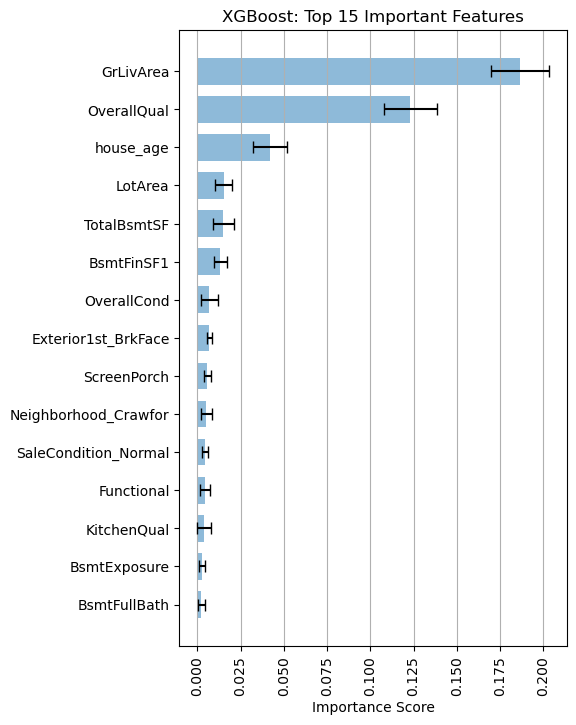

In [665]:
start_time = time.time()
reg_gb = xgb.XGBRegressor(learning_rate=0.1, max_depth=2, min_child_weight=4, \
                      n_estimators=400, subsample=0.5, random_state=42, \
                      colsample_bytree = 1, gamma=0.01, 
                      reg_alpha=0.0001, reg_lambda=0.001)

reg_gb.fit(X_train, y_train)

result_gb = permutation_importance(
    reg_gb, X_test, y_test, n_repeats=10, random_state=42, n_jobs=2
)

feature_names=list(X_train.columns)
imp_m   = pd.Series(result_gb.importances_mean, index=feature_names, name='Importance')
imp_std = pd.Series(result_gb.importances_std, index=feature_names, name='Std')
imp_df = pd.concat([imp_m, imp_std], axis=1)
imp_df = imp_df.sort_values('Importance', ascending=False)
imp_df = imp_df.iloc[:15][::-1]

plt.figure(figsize=(5, 8))
y_pos = np.arange(len(imp_df.index))
plt.barh(y_pos, imp_df.Importance, xerr=imp_df.Std, align='center', alpha=0.5, ecolor='black', capsize=4, height=0.7)
plt.xlabel('Importance Score')
plt.yticks(y_pos)
plt.yticks(y_pos, imp_df.index)
plt.title('XGBoost: Top 15 Important Features')
plt.xticks(rotation = 90) # Rotates X-Axis Ticks by 45-degrees
plt.gca().xaxis.grid(True)
plt.savefig('images/xgboost_fi.png', format='png', dpi=600, bbox_inches = 'tight')
plt.show()

### 2. Linear Regression Feature Importance

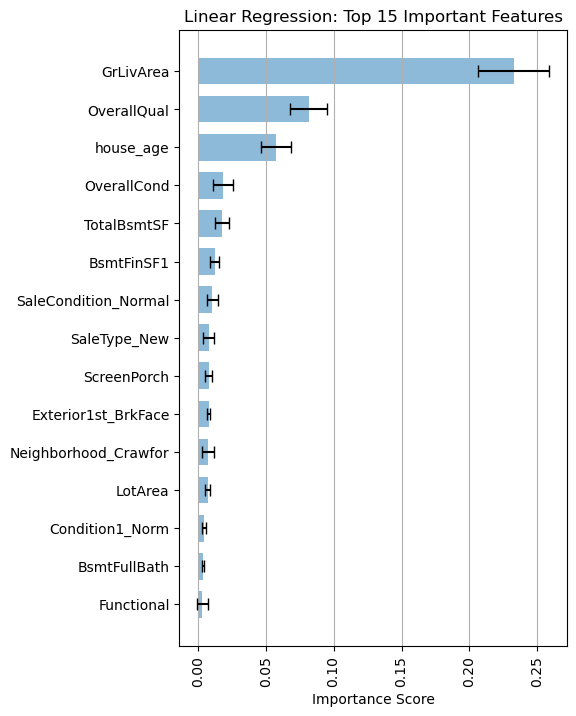

In [666]:
start_time = time.time()
reg_lr = LinearRegression()

reg_lr.fit(X_train, y_train)

result_gb = permutation_importance(
    reg_lr, X_test, y_test, n_repeats=10, random_state=42, n_jobs=2
)

feature_names=list(X_train.columns)
imp_m   = pd.Series(result_gb.importances_mean, index=feature_names, name='Importance')
imp_std = pd.Series(result_gb.importances_std, index=feature_names, name='Std')
imp_df = pd.concat([imp_m, imp_std], axis=1)
imp_df = imp_df.sort_values('Importance', ascending=False)
imp_df = imp_df.iloc[:15][::-1]

plt.figure(figsize=(5, 8))
y_pos = np.arange(len(imp_df.index))
plt.barh(y_pos, imp_df.Importance, xerr=imp_df.Std, align='center', alpha=0.5, ecolor='black', capsize=4, height=0.7)
plt.xlabel('Importance Score')
plt.yticks(y_pos)
plt.yticks(y_pos, imp_df.index)
plt.title('Linear Regression: Top 15 Important Features')
plt.xticks(rotation = 90) # Rotates X-Axis Ticks by 45-degrees
plt.gca().xaxis.grid(True)
plt.savefig('images/lr_fi.png', format='png', dpi=600, bbox_inches = 'tight')
plt.show()

### 3. XGBoost: Learning Curves

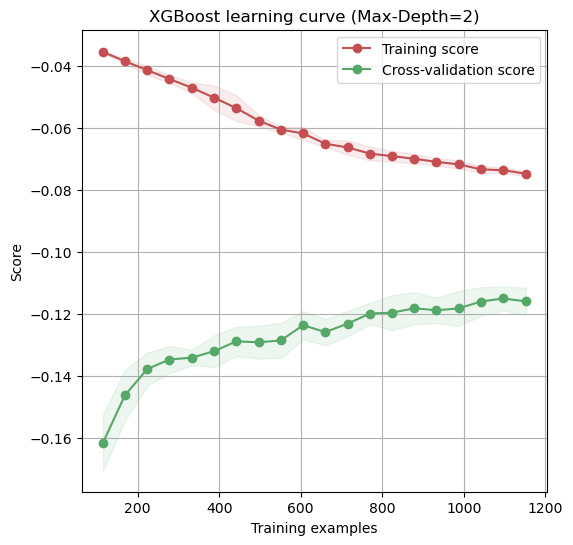

In [671]:
# https://scikit-learn.org/stable/auto_examples/model_selection/plot_learning_curve.html#sphx-glr-auto-examples-model-selection-plot-learning-curve-py
model = reg_gb
train_sizes, train_scores, test_scores, fit_times, _ = learning_curve(
    model,
    train_kaggle,
    np.log(train_y),
    cv=5,
    n_jobs=-1,
    train_sizes=np.linspace(0.1, 1.0, 20),
    return_times=True,
    scoring='neg_root_mean_squared_error'
)

train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)
fit_times_mean = np.mean(fit_times, axis=1)
fit_times_std = np.std(fit_times, axis=1)

plt.figure(figsize=(6,6))

plt.grid()
plt.fill_between(
    train_sizes,
    train_scores_mean - train_scores_std,
    train_scores_mean + train_scores_std,
    alpha=0.1,
    color="r",
)
plt.fill_between(
    train_sizes,
    test_scores_mean - test_scores_std,
    test_scores_mean + test_scores_std,
    alpha=0.1,
    color="g",
)
plt.plot(
    train_sizes, train_scores_mean, "o-", color="r", label="Training score"
)
plt.plot(
    train_sizes, test_scores_mean, "o-", color="g", label="Cross-validation score"
)
plt.legend(loc="best")
plt.xlabel("Training examples")
plt.ylabel("Score")
plt.title("XGBoost learning curve (Max-Depth=2)")
plt.savefig('images/xg_learning.png', format='png', dpi=600, bbox_inches = 'tight')
plt.show()

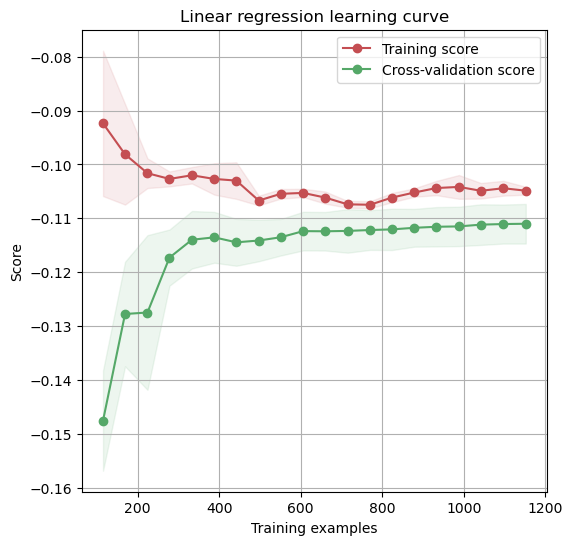

In [670]:
# https://scikit-learn.org/stable/auto_examples/model_selection/plot_learning_curve.html#sphx-glr-auto-examples-model-selection-plot-learning-curve-py
model = reg_lr
train_sizes, train_scores, test_scores, fit_times, _ = learning_curve(
    model,
    train_kaggle,
    np.log(train_y),
    cv=5,
    n_jobs=-1,
    train_sizes=np.linspace(0.1, 1.0, 20),
    return_times=True,
    scoring='neg_root_mean_squared_error'
)

train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)
fit_times_mean = np.mean(fit_times, axis=1)
fit_times_std = np.std(fit_times, axis=1)

plt.figure(figsize=(6,6))

plt.grid()
plt.fill_between(
    train_sizes,
    train_scores_mean - train_scores_std,
    train_scores_mean + train_scores_std,
    alpha=0.1,
    color="r",
)
plt.fill_between(
    train_sizes,
    test_scores_mean - test_scores_std,
    test_scores_mean + test_scores_std,
    alpha=0.1,
    color="g",
)
plt.plot(
    train_sizes, train_scores_mean, "o-", color="r", label="Training score"
)
plt.plot(
    train_sizes, test_scores_mean, "o-", color="g", label="Cross-validation score"
)
plt.legend(loc="best")
plt.xlabel("Training examples")
plt.ylabel("Score")
plt.title("Linear regression learning curve")
plt.savefig('images/lr_learning.png', format='png', dpi=600, bbox_inches = 'tight')
plt.show()

### 4. Plot predictions: Linear Regression

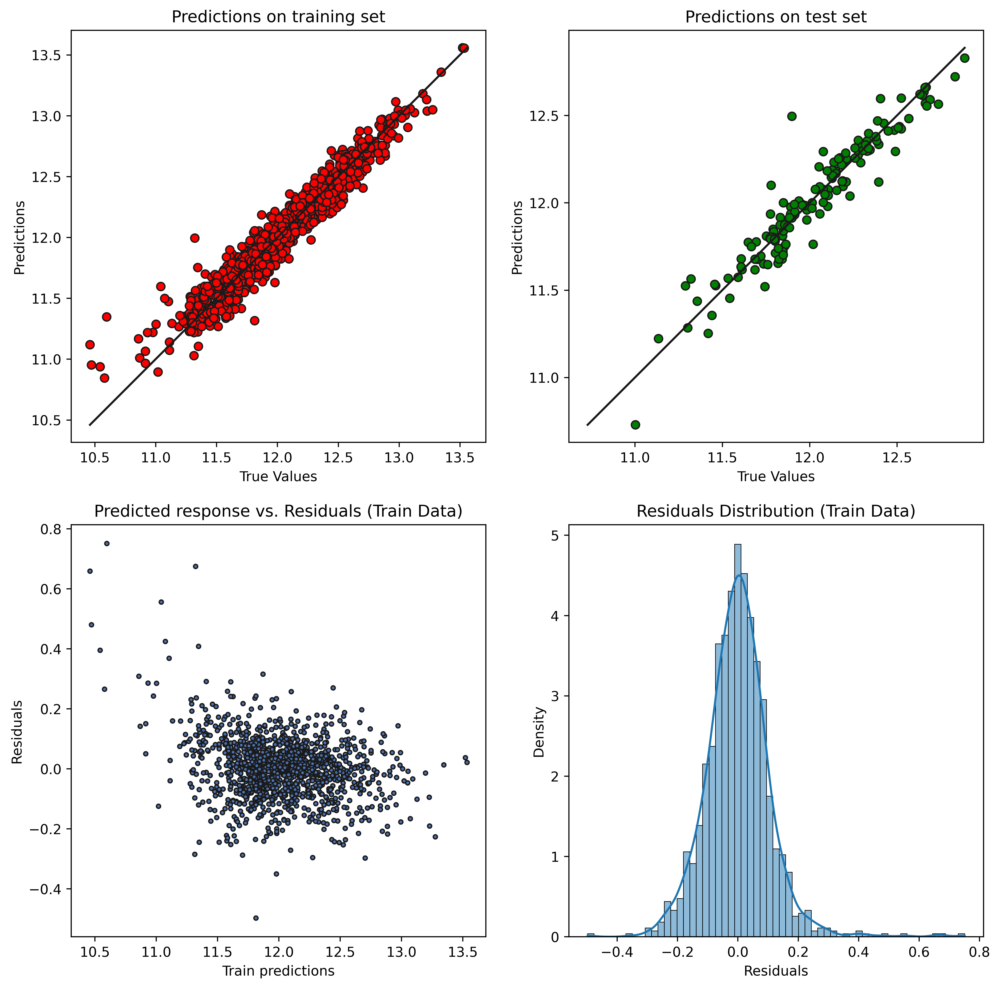

In [705]:
y_pred_train = reg_lr.predict(X_train)
y_pred_test = reg_lr.predict(X_test)
train_res=y_pred_train-y_train

fig, axs = plt.subplots(2, 2, figsize=(12,12), dpi=600) 

# fig.suptitle('Linear Regression Prediction Summary')
# Plot the train predictions
axs[0,0].scatter(y_train, y_pred_train, c='red', edgecolor='k')
p1 = max(max(y_pred_train), max(y_train))
p2 = min(min(y_pred_train), min(y_train))
axs[0,0].plot([p1, p2], [p1, p2], 'k-')
axs[0,0].set_xlabel('True Values')
axs[0,0].set_ylabel('Predictions')
axs[0,0].set_title("Predictions on training set")
axs[0,0].axis('equal')

# Plot the test predictions
axs[0,1].scatter(y_test, y_pred_test, c='green', edgecolor='k')
p1 = max(max(y_pred_test), max(y_test))
p2 = min(min(y_pred_test), min(y_test))
axs[0,1].plot([p1, p2], [p1, p2], 'k-')
axs[0,1].set_xlabel('True Values')
axs[0,1].set_ylabel('Predictions')
axs[0,1].set_title("Predictions on test set")
axs[0,1].axis('equal')

axs[1,0].scatter(y_train, y_pred_train-y_train, c='b', marker='.', edgecolor='k')
axs[1,0].set_xlabel('Train predictions')
axs[1,0].set_ylabel('Residuals')
axs[1,0].set_title("Predicted response vs. Residuals (Train Data)")

#axs[1,1].hist(y_pred_train-y_train, 25)
sns.histplot(ax=axs[1,1], data=pd.DataFrame({"Residuals":train_res}), x="Residuals", kde=True, stat='density')
axs[1,1].set_xlabel('Residuals')
axs[1,1].set_ylabel('Density')
axs[1,1].set_title("Residuals Distribution (Train Data)")

plt.savefig('images/lr_pred.png', format='png', dpi=600, bbox_inches = 'tight')
plt.show()

In [690]:
from scipy import stats
alpha = 1e-3
k2, p = stats.normaltest(y_pred_test-y_test)
if p < alpha:  # null hypothesis: x comes from a normal distribution
    print("The null hypothesis can be rejected")
else:
    print("The null hypothesis cannot be rejected")

The null hypothesis can be rejected


### 5. Plot Predictions XGBoost

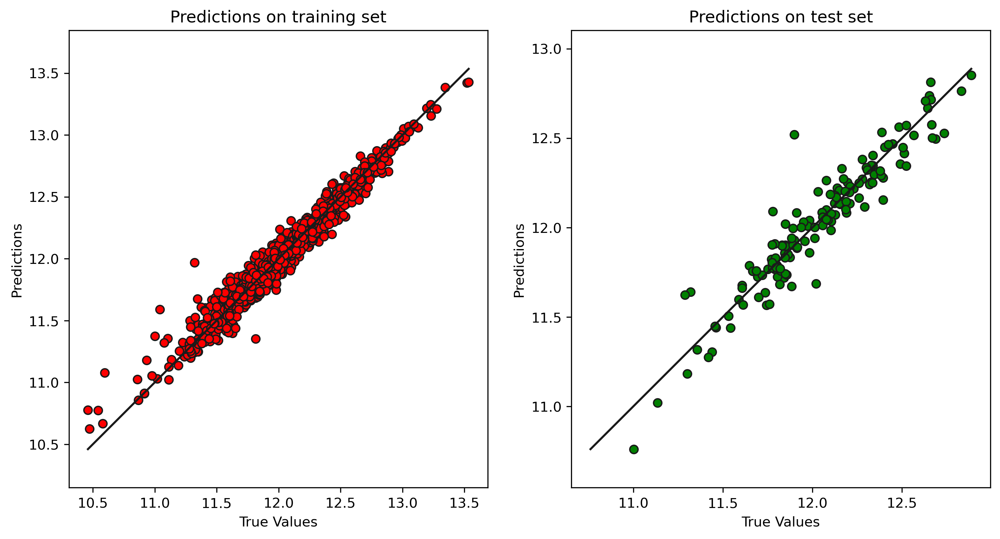

In [706]:
y_pred_train = reg_xg.predict(X_train)
y_pred_test = reg_xg.predict(X_test)



fig, axs = plt.subplots(1, 2, figsize=(12,6), dpi=300) 

# Plot the train predictions
axs[0].scatter(y_train, y_pred_train, c='red', edgecolor='k')
p1 = max(max(y_pred_train), max(y_train))
p2 = min(min(y_pred_train), min(y_train))
axs[0].set_title("Predictions on training set")
axs[0].plot([p1, p2], [p1, p2], 'k-')
axs[0].set_xlabel('True Values')
axs[0].set_ylabel('Predictions')
axs[0].axis('equal')

# Plot the test predictions
axs[1].scatter(y_test, y_pred_test, c='green', edgecolor='k')
p1 = max(max(y_pred_test), max(y_test))
p2 = min(min(y_pred_test), min(y_test))
axs[1].set_title("Predictions on test set")
axs[1].plot([p1, p2], [p1, p2], 'k-')
axs[1].set_xlabel('True Values')
axs[1].set_ylabel('Predictions')
axs[1].axis('equal')

plt.savefig('images/xg_pred.png', format='png', dpi=600, bbox_inches = 'tight')
plt.show()

## Prepare Kaggle Submission

In [651]:
xg = xgb.XGBRegressor(learning_rate=0.1, max_depth=2, min_child_weight=4, \
                      n_estimators=400, subsample=0.5, random_state=42, \
                      colsample_bytree = 1, gamma=0.01, 
                      reg_alpha=0.0001, reg_lambda=0.001)
xg.fit(train_kaggle, np.log(train_y))
kaggle_pred=np.exp(xg.predict(test_kaggle))
np.savetxt("data/kaggle_pred.csv", kaggle_pred, delimiter=",")

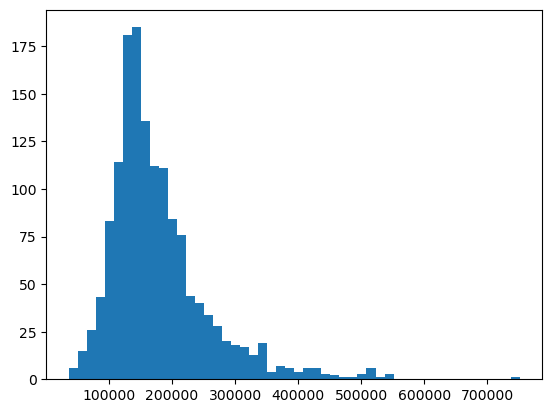

In [652]:
plt.hist(kaggle_pred, 50)
plt.show()

## Reference

1. Data Cleaning: https://www.kaggle.com/code/serigne/stacked-regressions-top-4-on-leaderboard/notebook
2. Boxplots: https://towardsdatascience.com/a-complete-guide-to-plotting-categorical-variables-with-seaborn-bfe54db66bec
3. Outlier: https://datascience.stackexchange.com/questions/54808/how-to-remove-outliers-using-box-plot
4. Notebook-1: https://www.kaggle.com/code/serigne/stacked-regressions-top-4-on-leaderboard/notebook
5. Notebook-2: https://www.kaggle.com/code/ogakulov/lotfrontage-fill-in-missing-values-house-prices/notebook
6. Stacking: https://scikit-learn.org/stable/auto_examples/ensemble/plot_stack_predictors.html#sphx-glr-auto-examples-ensemble-plot-stack-predictors-py7. 
7. VIF: https://medium.com/analytics-vidhya/multicollinearity-regularization-lasso-ridge-and-polynomial-regression-93bc90d2e4d
8. Optimizing XGBoost: https://www.kaggle.com/code/prashant111/a-guide-on-xgboost-hyperparameters-tuning/notebook
